In [1]:

import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.




0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 17.3ms
1: 640x640 4 persons, 1 bus, 17.3ms
Speed: 4.4ms preprocess, 17.3ms inference, 48.8ms postprocess per image at shape (1, 3, 640, 640)


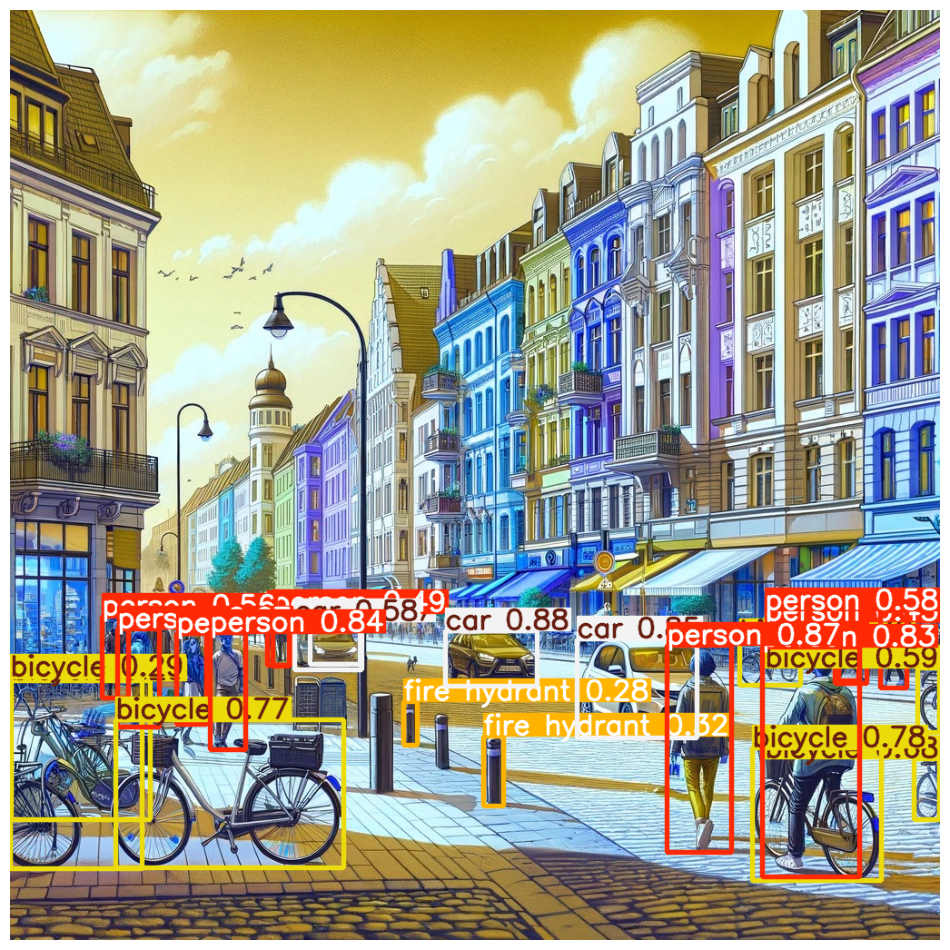

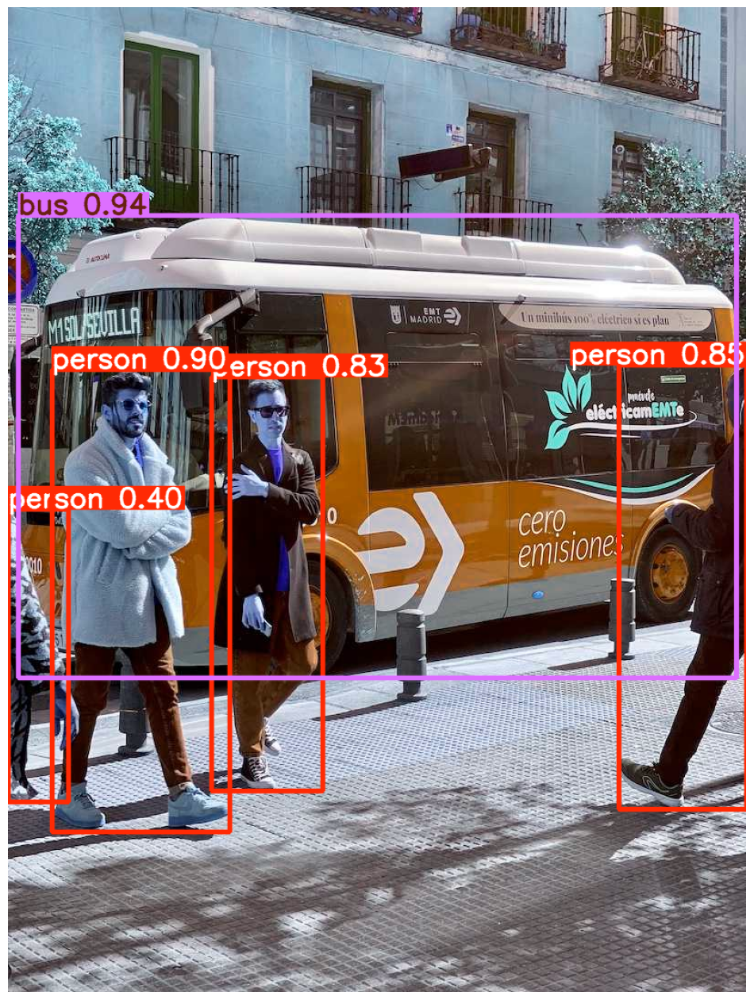

In [ ]:
model = YOLO("Resultados/yolo11n.pt")

image_paths = ["Datos/deteccion_objetos.jpg", "Datos/bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")  # Opcional: oculta los ejes
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](Datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](Datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.


0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 2.2ms
1: 640x640 4 persons, 1 bus, 2.2ms
Speed: 1.3ms preprocess, 2.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


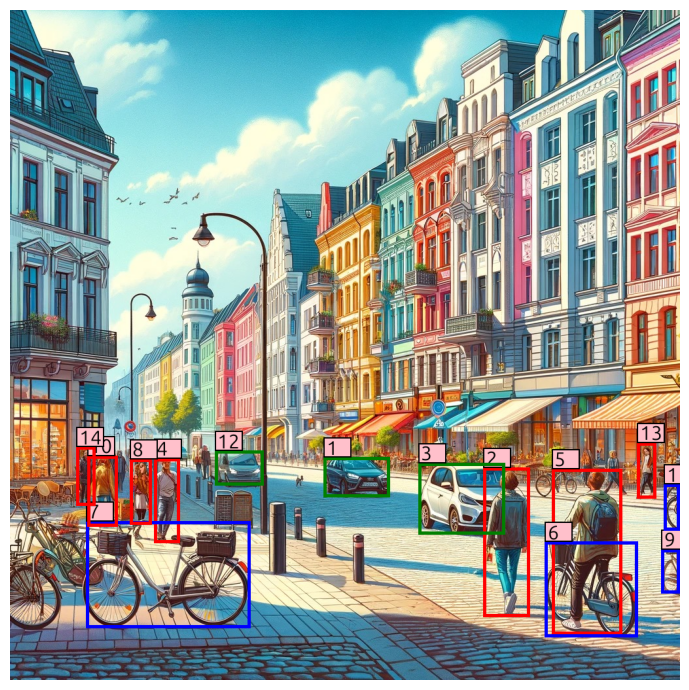

Recuadro 1: Clase=car, Score=0.88, Caja=tensor([479.8758, 683.5800, 580.6983, 744.1751], device='cuda:0')
Recuadro 2: Clase=person, Score=0.87, Caja=tensor([723.7451, 699.7953, 794.2310, 927.2588], device='cuda:0')
Recuadro 3: Clase=car, Score=0.85, Caja=tensor([624.1940, 692.2718, 756.4965, 801.8298], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([220.3913, 685.3433, 259.8542, 814.4560], device='cuda:0')
Recuadro 5: Clase=person, Score=0.83, Caja=tensor([828.1981, 701.1078, 935.8105, 954.4067], device='cuda:0')
Recuadro 6: Clase=bicycle, Score=0.78, Caja=tensor([817.9761, 812.7619, 959.3066, 958.3049], device='cuda:0')
Recuadro 7: Clase=bicycle, Score=0.77, Caja=tensor([116.0802, 781.4430, 367.3249, 944.4625], device='cuda:0')
Recuadro 8: Clase=person, Score=0.72, Caja=tensor([183.1241, 686.1921, 216.1971, 786.6392], device='cuda:0')
Recuadro 9: Clase=bicycle, Score=0.68, Caja=tensor([ 995.5506,  824.0292, 1023.6959,  891.5807], device='cuda:0')
Recuadro 10: Clase

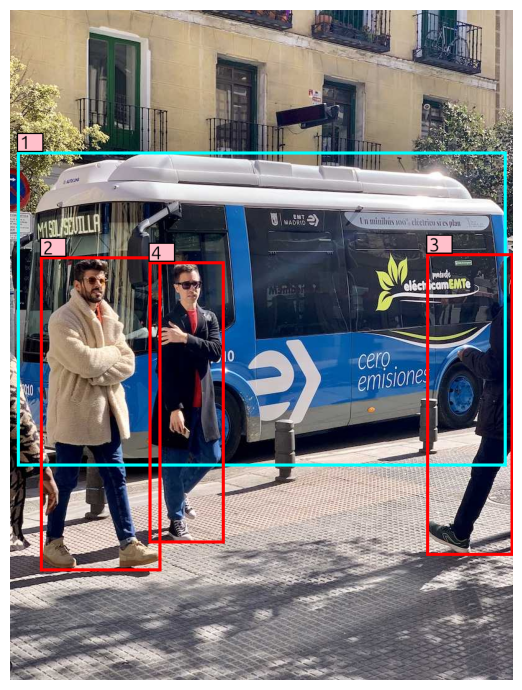

Recuadro 1: Clase=bus, Score=0.94, Caja=tensor([ 11.8105, 228.3198, 799.1911, 735.1796], device='cuda:0')
Recuadro 2: Clase=person, Score=0.90, Caja=tensor([ 48.6259, 397.9621, 243.2043, 904.5430], device='cuda:0')
Recuadro 3: Clase=person, Score=0.85, Caja=tensor([670.5917, 392.6411, 810.0000, 879.6390], device='cuda:0')
Recuadro 4: Clase=person, Score=0.83, Caja=tensor([223.1290, 405.5979, 345.2336, 859.7033], device='cuda:0')


In [8]:
model = YOLO("Resultados/yolo11n.pt")
image_paths = ["Datos/deteccion_objetos.jpg", "Datos/bus.jpg"]
results = model(image_paths)

# Obtén la imagen con los recuadros
for i,_ in enumerate(results):
    detections = results[i].boxes 
    filtered_detections = []  

    for j, (cls, score, box) in enumerate(zip(detections.cls, detections.conf, detections.xyxy)):
        if score > 0.5:  
            filtered_detections.append((j, cls, score, box))

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("usr/share/fonts/truetype/ubuntu/Ubuntu-B.ttf", size=30)

    legend = []

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)] 

    for idx, (i, cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))
        #box = box.tolist()

        legend.append(f"Recuadro {idx}: Clase={class_name}, Score={score:.2f}, Caja={box}")
        
        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+2 + 40, box[1]],fill="black")
        draw.rectangle([box[0]+2, box[1]-28, box[0] + 40, box[1]-2],fill="pink")
        draw.text((box[0]+8, box[1]-32), str(idx), fill="black",font=font)

    plt.figure(figsize=(13,7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    [print(i) for i in legend] 

## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 9 bicycles, 3 cars, 1 backpack, 2.6ms
1: 640x640 4 persons, 1 bus, 2.6ms
Speed: 1.7ms preprocess, 2.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


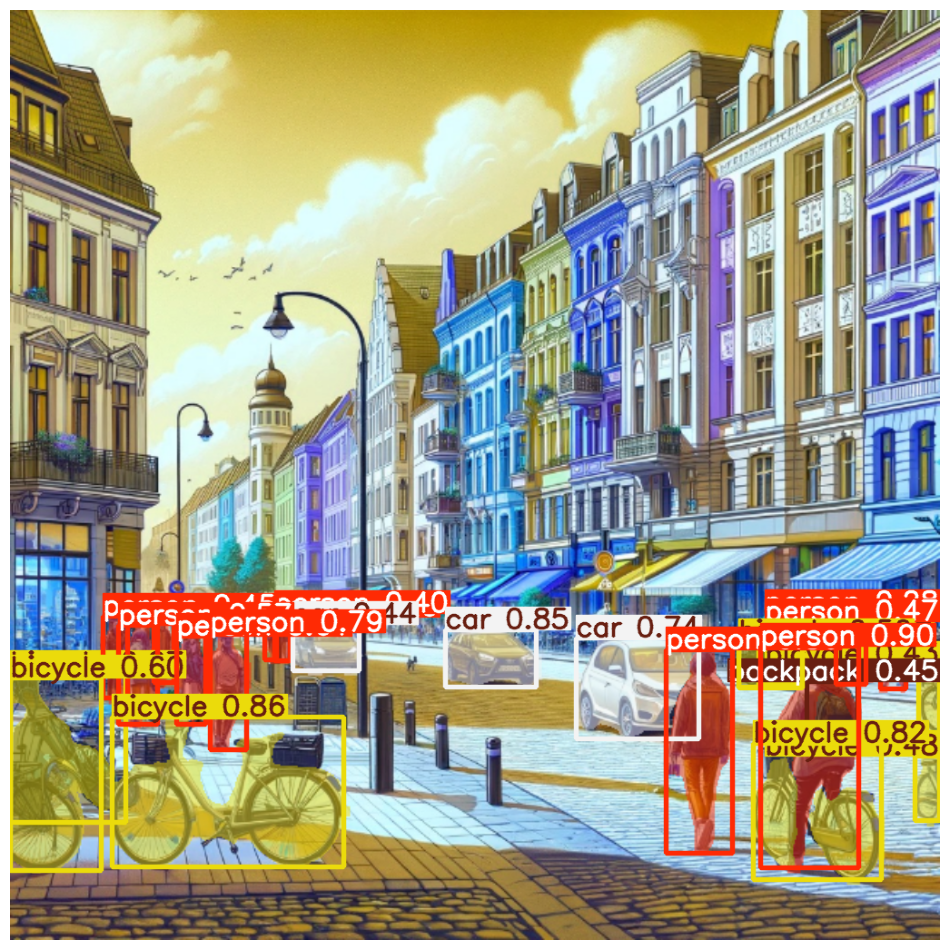

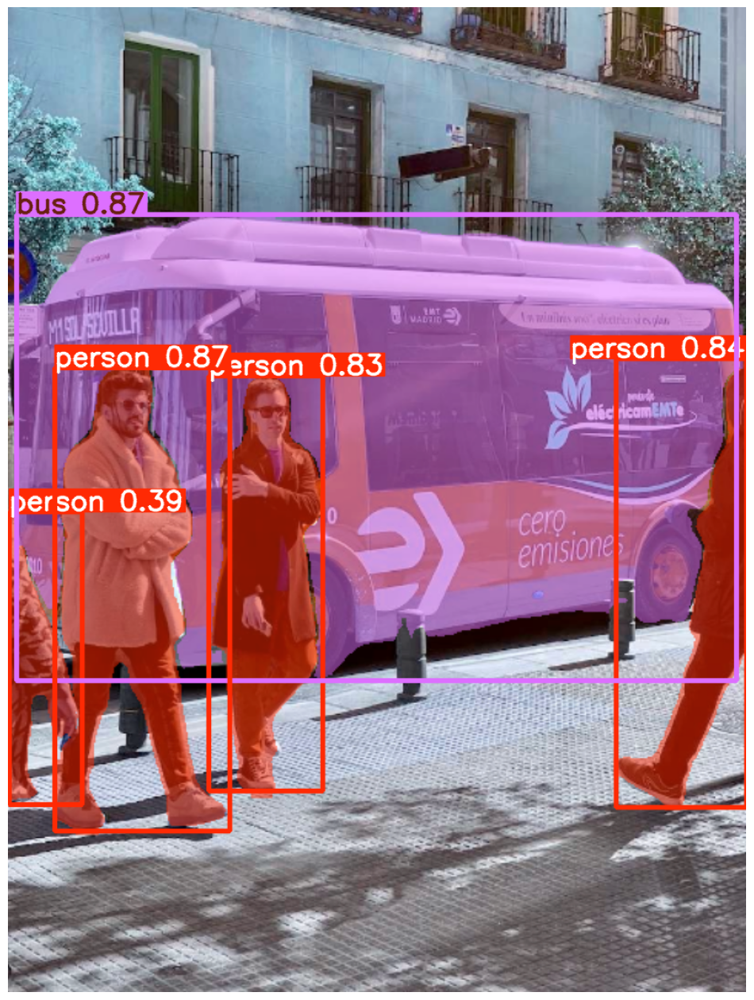

In [ ]:
model = YOLO('Resultados/yolo11n-seg.pt')
image_paths = ["Datos/deteccion_objetos.jpg", "Datos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.

100%|██████████| 5.97M/5.97M [00:00<00:00, 31.3MB/s]



0: 640x640 2 persons, 6.3ms
1: 640x640 4 persons, 6.3ms
Speed: 1.2ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


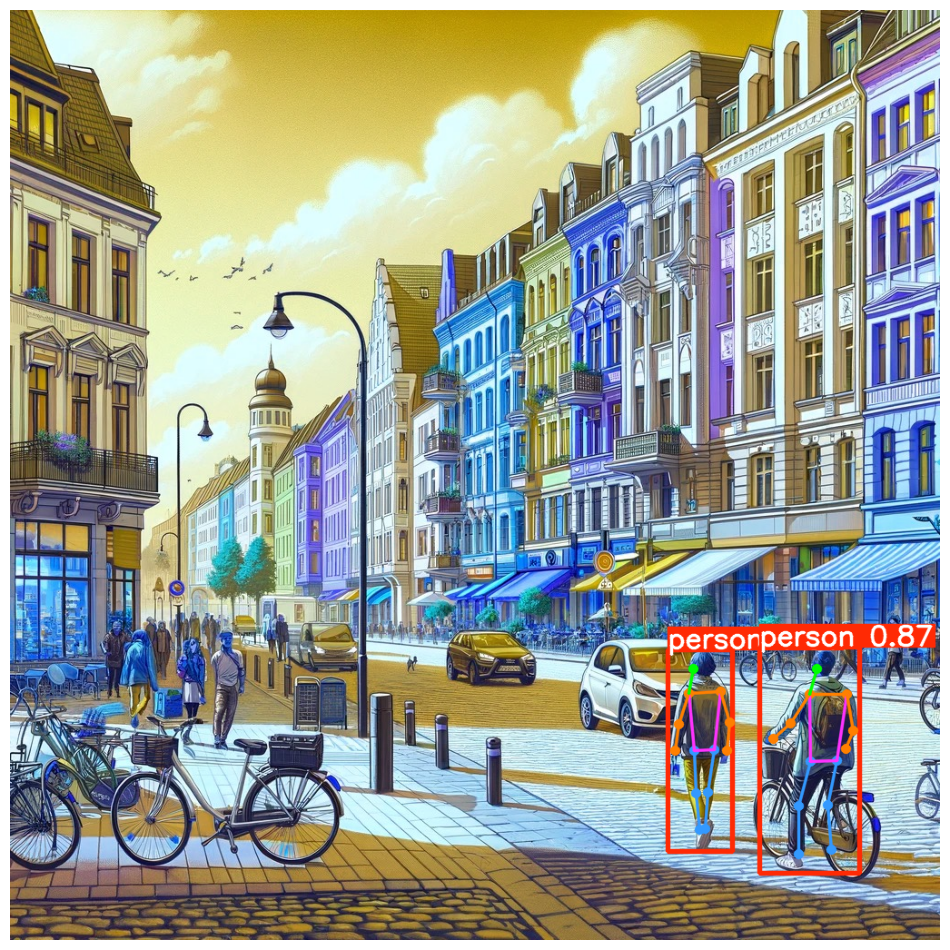

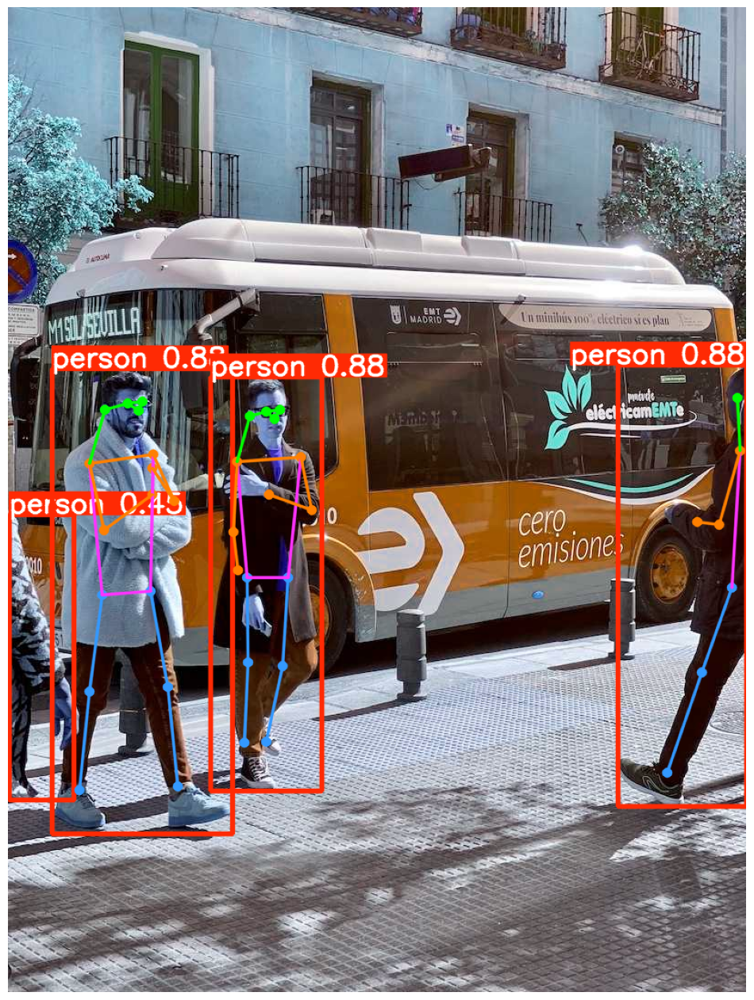

In [19]:
model = YOLO('Resultados/yolo11n-pose.pt')
image_paths = ["Datos/deteccion_objetos.jpg", "Datos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

In [24]:
!yolo predict model="Resultados/yolo11n.pt" source='Datos/image3.jpg' project="Resultados/predicciones" conf=0.25 task=detect mode=predict save=True

Ultralytics 8.3.40 🚀 Python-3.12.8 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

image 1/1 /home/iabd/onedrive/SAPA/UD5 - Redes convolucionales (tratamiento de imagenes)/Datos/image3.jpg: 448x640 6 persons, 1 dog, 29.4ms
Speed: 2.2ms preprocess, 29.4ms inference, 74.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to Resultados/predicciones/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict



0: 448x640 6 persons, 1 dog, 3.4ms
Speed: 0.9ms preprocess, 3.4ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)
Resultados guardados en 'resultado.jpg'.


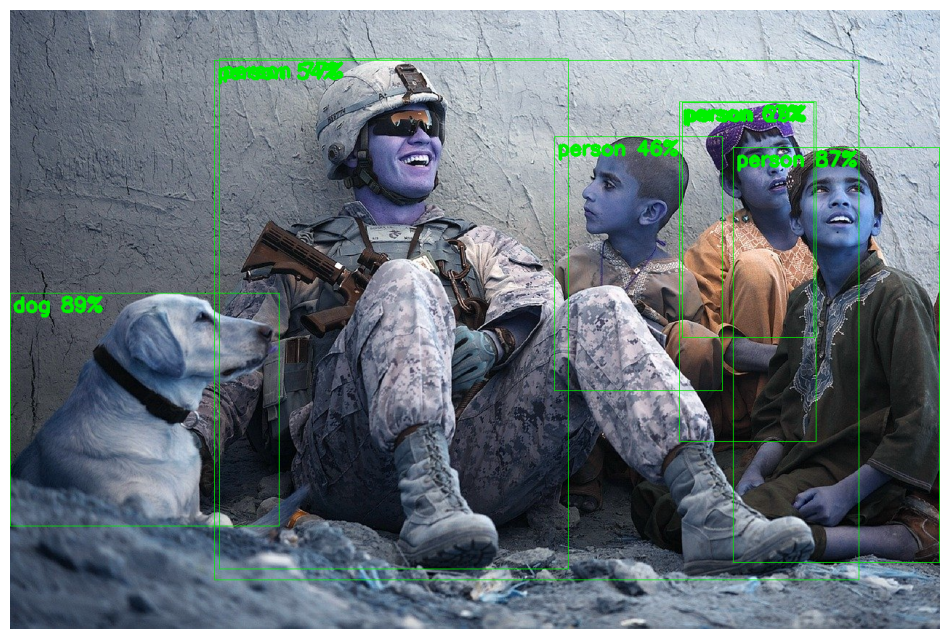

In [ ]:
model = YOLO("Resultados/yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.9
color = (0, 240, 0)
thickness = 2

img = cv2.imread('Datos/image3.jpg') 
results = model(img)

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        confidence = math.ceil((box.conf[0]*100))
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imwrite('Resultados/resultado.jpg', img)

plt.figure(figsize=(12, 20)) 
plt.imshow(img)
plt.axis("off") 
plt.show()

In [ ]:
model = YOLO("Resultados/yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    #cv2.imshow('Webcam', img)

    #if cv2.waitKey(1) == ord('q'):
        #break

cap.release()
#cv2.destroyAllWindows()


0: 480x640 2 persons, 3 couchs, 32.9ms
Speed: 1.6ms preprocess, 32.9ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


In [6]:
!yolo task=detect mode=train epochs=50 batch=10 model='Resultados/yolo11s' data='/home/iabd/sapa/datasets/matriculas/data.yaml' project="Resultados/predicciones"

New https://pypi.org/project/ultralytics/8.3.67 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.12.8 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=Resultados/yolo11s, data=/home/iabd/sapa/datasets/matriculas/data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/home/iabd/sapa/resultados/predicciones, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agn

In [9]:
!yolo predict model='/home/iabd/sapa/resultados/predicciones/train/weights/best.pt' source='Datos/coche_con_matricula.jpeg' project="Resultados/predicciones" conf=0.35

Ultralytics 8.3.40 🚀 Python-3.12.8 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /home/iabd/onedrive/SAPA/UD5 - Redes convolucionales (tratamiento de imagenes)/Datos/coche_con_matricula.jpeg: 384x640 1 licence, 32.8ms
Speed: 2.2ms preprocess, 32.8ms inference, 65.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to Resultados/predicciones/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

Iniciando entrenamiento...
New https://pypi.org/project/ultralytics/8.3.67 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.12.8 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=Resultados/yolo11s.pt, data=/home/iabd/sapa/datasets/matriculas/data.yaml, epochs=50, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/home/iabd/sapa/resultados/predicciones, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visu

train: Scanning /home/iabd/sapa/datasets/matriculas/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/sapa/datasets/matriculas/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to /home/iabd/sapa/resultados/predicciones/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/iabd/sapa/resultados/predicciones/train6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.84G      1.813      7.614      1.604         22        640: 100%|██████████| 21/21 [00:01<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.67it/s]

                   all         60         64      0.356      0.266       0.24      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.82G      1.676      2.791      1.355         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.90it/s]

                   all         60         64       0.22      0.281      0.147     0.0674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.81G      1.739      2.041      1.486         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.13it/s]

                   all         60         64      0.038      0.188     0.0188    0.00678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.81G      1.748      1.713      1.459         16        640: 100%|██████████| 21/21 [00:01<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.40it/s]

                   all         60         64    0.00155     0.0312   0.000492   0.000216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.81G      1.805      1.671       1.56         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.65it/s]

                   all         60         64   0.000611      0.172   0.000378   0.000183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.81G      1.823      1.744      1.513         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.34it/s]

                   all         60         64     0.0005      0.141   0.000289   0.000117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.81G      1.747       1.46      1.424         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


                   all         60         64    0.00176      0.453    0.00127   0.000628

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.81G      1.721      1.316      1.458         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


                   all         60         64     0.0219      0.625      0.019    0.00967

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.81G      1.776      1.377      1.473         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.60it/s]


                   all         60         64      0.426      0.547      0.443      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.81G      1.659      1.219      1.424         30        640: 100%|██████████| 21/21 [00:01<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.13it/s]


                   all         60         64      0.434      0.531      0.353      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.81G      1.641      1.247      1.377         21        640: 100%|██████████| 21/21 [00:01<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


                   all         60         64      0.217      0.391      0.227      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.81G      1.636      1.201      1.411         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.18it/s]


                   all         60         64      0.185      0.391      0.115     0.0572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.81G      1.625      1.184      1.412         30        640: 100%|██████████| 21/21 [00:01<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.30it/s]

                   all         60         64      0.743      0.562      0.648      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.81G      1.625       1.21      1.387         18        640: 100%|██████████| 21/21 [00:01<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.39it/s]

                   all         60         64      0.726      0.594      0.615      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.81G      1.549      1.159      1.378         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.74it/s]

                   all         60         64      0.882        0.5      0.658      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.81G      1.522      1.092      1.327         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.67it/s]


                   all         60         64      0.769      0.625      0.708      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.81G      1.522      1.047      1.382         16        640: 100%|██████████| 21/21 [00:01<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.86it/s]

                   all         60         64      0.871      0.578      0.685      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.81G      1.517      1.051      1.292         26        640: 100%|██████████| 21/21 [00:01<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.37it/s]

                   all         60         64      0.781      0.668      0.765      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.81G      1.486      1.019      1.307         16        640: 100%|██████████| 21/21 [00:01<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.48it/s]

                   all         60         64      0.723      0.734      0.774      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.81G       1.46     0.9891      1.282         18        640: 100%|██████████| 21/21 [00:01<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.32it/s]

                   all         60         64      0.783      0.656      0.757       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.81G      1.485      1.056      1.299         17        640: 100%|██████████| 21/21 [00:01<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.80it/s]

                   all         60         64        0.8        0.5      0.657       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.81G      1.462     0.9447      1.297         21        640: 100%|██████████| 21/21 [00:01<00:00, 11.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.36it/s]

                   all         60         64      0.819      0.547      0.667      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.81G      1.436      1.001      1.289         16        640: 100%|██████████| 21/21 [00:01<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.57it/s]


                   all         60         64      0.726      0.704      0.758      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.81G      1.456     0.9296      1.276         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.41it/s]

                   all         60         64      0.762      0.766      0.753      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.81G      1.366     0.8956      1.273         21        640: 100%|██████████| 21/21 [00:01<00:00, 11.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.38it/s]

                   all         60         64      0.756      0.719      0.768      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.82G      1.476      0.963      1.304         15        640: 100%|██████████| 21/21 [00:01<00:00, 11.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.51it/s]

                   all         60         64      0.787      0.781      0.841      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       2.8G      1.443     0.9637      1.286         31        640: 100%|██████████| 21/21 [00:01<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.47it/s]

                   all         60         64      0.714      0.703      0.779      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.81G      1.316     0.8817      1.206         22        640: 100%|██████████| 21/21 [00:01<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.75it/s]

                   all         60         64      0.882      0.688       0.79      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       2.8G      1.354     0.8666      1.197         22        640: 100%|██████████| 21/21 [00:01<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.49it/s]

                   all         60         64      0.783      0.719      0.775      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       2.8G      1.354     0.9018      1.252         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.11it/s]


                   all         60         64      0.824      0.656      0.801      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.81G      1.313     0.8306       1.18         23        640: 100%|██████████| 21/21 [00:01<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.62it/s]


                   all         60         64      0.835      0.719      0.846       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.81G      1.278     0.8459      1.225         19        640: 100%|██████████| 21/21 [00:01<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.40it/s]

                   all         60         64      0.822      0.781      0.843      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.81G      1.279     0.8237        1.2         24        640: 100%|██████████| 21/21 [00:01<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.68it/s]

                   all         60         64      0.828      0.797      0.823      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.81G      1.248     0.7961      1.163         20        640: 100%|██████████| 21/21 [00:01<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.40it/s]

                   all         60         64      0.812      0.808      0.826      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.81G      1.231     0.8006      1.178         28        640: 100%|██████████| 21/21 [00:01<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.49it/s]

                   all         60         64      0.847       0.78      0.851      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.81G      1.209     0.7768      1.156         28        640: 100%|██████████| 21/21 [00:01<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.65it/s]


                   all         60         64      0.817      0.812      0.855      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.81G      1.263     0.7751      1.171         29        640: 100%|██████████| 21/21 [00:01<00:00, 11.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.31it/s]

                   all         60         64      0.815      0.812      0.849      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.81G      1.241      0.793      1.199         25        640: 100%|██████████| 21/21 [00:01<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.13it/s]

                   all         60         64      0.871      0.737      0.859      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.81G      1.156     0.7263      1.111         26        640: 100%|██████████| 21/21 [00:01<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.96it/s]

                   all         60         64      0.865       0.75      0.858      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.81G      1.176     0.7495      1.152         14        640: 100%|██████████| 21/21 [00:01<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.29it/s]

                   all         60         64        0.8      0.734      0.833      0.471


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.81G       1.16     0.7029      1.131         11        640: 100%|██████████| 21/21 [00:01<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


                   all         60         64      0.776       0.75      0.776      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.81G       1.17     0.6928      1.165          9        640: 100%|██████████| 21/21 [00:01<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.43it/s]

                   all         60         64      0.823      0.781      0.813      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.81G      1.171     0.6771       1.15         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.33it/s]

                   all         60         64      0.815      0.766      0.819      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.81G      1.095     0.6344      1.109         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.33it/s]

                   all         60         64      0.884      0.766      0.829      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.81G      1.121     0.6515      1.152         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.18it/s]

                   all         60         64      0.764      0.828      0.818      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.81G      1.129     0.6566      1.133         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.55it/s]


                   all         60         64      0.833      0.797      0.839      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.81G      1.064     0.6179      1.076         10        640: 100%|██████████| 21/21 [00:01<00:00, 11.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.97it/s]

                   all         60         64      0.845      0.766      0.846      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.81G      1.043     0.6298      1.118         11        640: 100%|██████████| 21/21 [00:01<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.36it/s]

                   all         60         64      0.922      0.797      0.889      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.81G      1.034     0.6061       1.07         12        640: 100%|██████████| 21/21 [00:01<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 14.93it/s]

                   all         60         64      0.876      0.797      0.863       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.81G     0.9986     0.5826      1.056         13        640: 100%|██████████| 21/21 [00:01<00:00, 11.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 15.13it/s]

                   all         60         64      0.872      0.797      0.854      0.484



50 epochs completed in 0.037 hours.
Optimizer stripped from /home/iabd/sapa/resultados/predicciones/train6/weights/last.pt, 19.2MB
Optimizer stripped from /home/iabd/sapa/resultados/predicciones/train6/weights/best.pt, 19.2MB

Validating /home/iabd/sapa/resultados/predicciones/train6/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.12.8 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.76it/s]


                   all         60         64      0.871      0.742      0.859      0.494
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /home/iabd/sapa/resultados/predicciones/train6
Entrenamiento completado.
Iniciando predicción...

image 1/1 /home/iabd/onedrive/SAPA/UD5 - Redes convolucionales (tratamiento de imagenes)/Datos/coche_con_matricula.jpeg: 384x640 1 licence, 5.1ms
Speed: 1.7ms preprocess, 5.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to Resultados/predicciones/predict8
Predicción completada.
Resultados guardados en: Resultados/predicciones/predicted_image.jpg


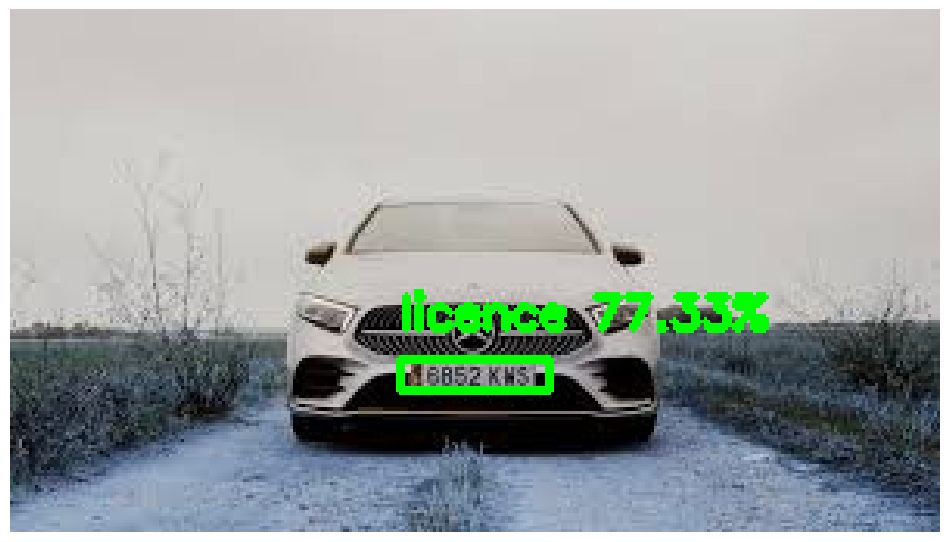

In [7]:
# Define rutas de entrada y salida
train_data = '/home/iabd/sapa/datasets/matriculas/data.yaml'
train_model = 'Resultados/yolo11s'
train_project = 'Resultados/predicciones'

predict_model = 'Resultados/predicciones/train/weights/best.pt'
predict_source = 'Datos/coche_con_matricula.jpeg'
predict_output = 'Resultados/predicciones'
conf_threshold = 0.35

# Entrenamiento
print("Iniciando entrenamiento...")
model = YOLO(train_model)  # Cargar modelo
model.train(
    data=train_data,
    epochs=50,
    batch=10,
    project=train_project
)
print("Entrenamiento completado.")

# Predicción
print("Iniciando predicción...")
model = YOLO(predict_model)  # Cargar modelo entrenado
results = model.predict(
    source=predict_source,
    project=predict_output,
    conf=conf_threshold,
    save=True
)
print("Predicción completada.")

# Mostrar resultados
for result in results:
    img = result.orig_img  # Imagen original
    for box in result.boxes:
        # Extraer coordenadas del cuadro delimitador
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convertir a enteros
        label = f"{result.names[int(box.cls[0])]} {box.conf[0]*100:.2f}%"

        # Dibujar cuadros y etiquetas
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Mostrar imagen con predicciones
    #cv2.imshow('Resultados', img)

    # Guardar resultados
    output_path = f"{predict_output}/predicted_image.jpg"
    cv2.imwrite(output_path, img)
    print(f"Resultados guardados en: {output_path}")

    plt.figure(figsize=(12, 20)) 
    plt.imshow(img)
    plt.axis("off") 
    plt.show()

    # Esperar para cerrar la ventana
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()


## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4

Ultralytics Solutions: ✅ {'region': [(386, 103), (458, 499)], 'show_in': True, 'show_out': False, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'model': 'Resultados/yolo11s.pt', 'classes': [0], 'line_width': 2}

0: 320x640 (no detections), 33.0ms
Speed: 3.9ms preprocess, 33.0ms inference, 27.4ms postprocess per image at shape (1, 3, 320, 640)
WARNING ⚠️ no tracks found!
Mouse position: (638, 445)
Mouse position: (636, 441)

0: 320x640 (no detections), 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 640)
WARNING ⚠️ no tracks found!
Mouse position: (633, 432)
Mouse position: (632, 428)

0: 320x640 1 person, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 36.8ms postprocess per image at shape (1, 3, 320, 640)
WARNING ⚠️ no tracks found!
Mouse position: (587, 341)
Mouse position: (573, 318)

0: 320x640 (no detections), 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.

## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

## EJERCICIO  11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS